In [1]:
import geopandas as gpd
import numpy as np
import pandas as pd
from PIL import Image

import sys
sys.path.append('../_styling/')
from style import prep_plot

In [2]:
# get conversions between 2 letter and 3 letter IBAN country codes
codes = pd.read_html("https://www.iban.com/country-codes")[0]
iso = dict(zip(codes['Alpha-2 code'], codes['Alpha-3 code']))
codes.head(1)

,Country,Alpha-2 code,Alpha-3 code,Numeric
0,Afghanistan,AF,AFG,4


In [3]:
# developers by geography
devs = pd.read_csv("developers.csv")
devs['iso3_code'] = devs['iso2_code'].map(iso)
devs['developers'] = pd.to_numeric(devs['developers'])
devs.head(1)

,developers,iso2_code,year,quarter,iso3_code
0,9763122,US,2020,1,USA


In [4]:
# adult population by geography
pop = pd.read_csv("b3e69f7a-fe20-4273-af49-0148278ab19d_Data.csv", index_col=3)
pop = (
    pop
    .rename(columns={'2022 [YR2022]': 'pop_15-64'})
    [pop['Series Code'] == 'SP.POP.1564.TO']
    .dropna()
    [['pop_15-64']]
)
pop['pop_15-64'] = pd.to_numeric(pop['pop_15-64'], errors='coerce')
pop.loc['TWN', 'pop_15-64'] = 16_299_548
pop.head(1)

,pop_15-64
Country Code,
AFG,22404909.0


In [5]:
# world map
world = (
    gpd.read_file("ne_110m_admin_0_countries_lakes/ne_110m_admin_0_countries_lakes.shp")
    .set_index('ADM0_A3')
    [['geometry']]
)
world.head(1)

,geometry
ADM0_A3,
FJI,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."


In [6]:
# join it all into one geodataframe
df = devs.set_index('iso3_code').join(pop)
df['dev_ratio'] = df['developers'] / df['pop_15-64']
df = df.join(world)
gdf = gpd.GeoDataFrame(df, geometry='geometry')
gdf.head(1)

,developers,iso2_code,year,quarter,pop_15-64,dev_ratio,geometry
iso3_code,,,,,,,
ABW,1006,AW,2020,1,71975.0,0.013977,None


True

<Figure size 3740x1496 with 0 Axes>

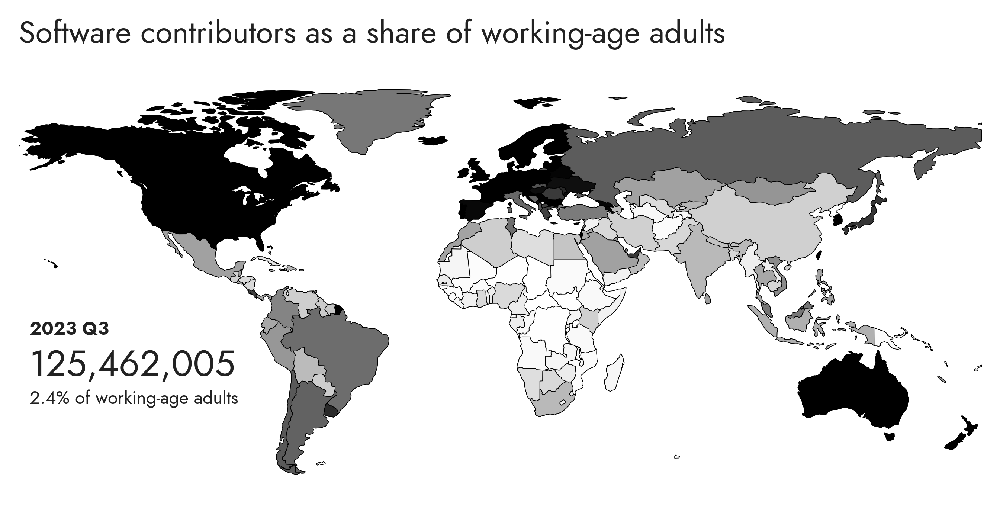

In [7]:
# generate the maps
plt = prep_plot()

def make_map(year, quarter):    
    gdff = gdf.query("year == @year & quarter == @quarter")
    if not len(gdff):
        return False
    
    fig, ax = plt.subplots()
    gdff.plot(column='dev_ratio', cmap='gist_yarg', lw=.25, edgecolor='black', vmax=.05, zorder=1, ax=ax)
    world.plot(color="white", lw=.25, edgecolor='black', ax=ax, zorder=0)

    plt.xlim([-169,180])
    plt.ylim([-60,95])
    plt.xticks([])
    plt.yticks([])
    plt.gca().spines[['left', 'bottom']].set_visible(False)

    total = gdff['developers'].sum()
    total_pop = gdff['pop_15-64'].sum()
    share = (total / total_pop) * 100
    plt.text(s=f"{year} Q{quarter}", x=-165, y=-5, fontsize=7, fontweight='bold')
    plt.text(s=f"{total:,.0f}", x=-165, y=-20, fontsize=14)
    plt.text(s=f"{share:,.1f}% of working-age adults", x=-165, y=-30, fontsize=7)
    plt.title("Software contributors as a share of working-age adults", loc='left')
    return True

make_map(2023,3)

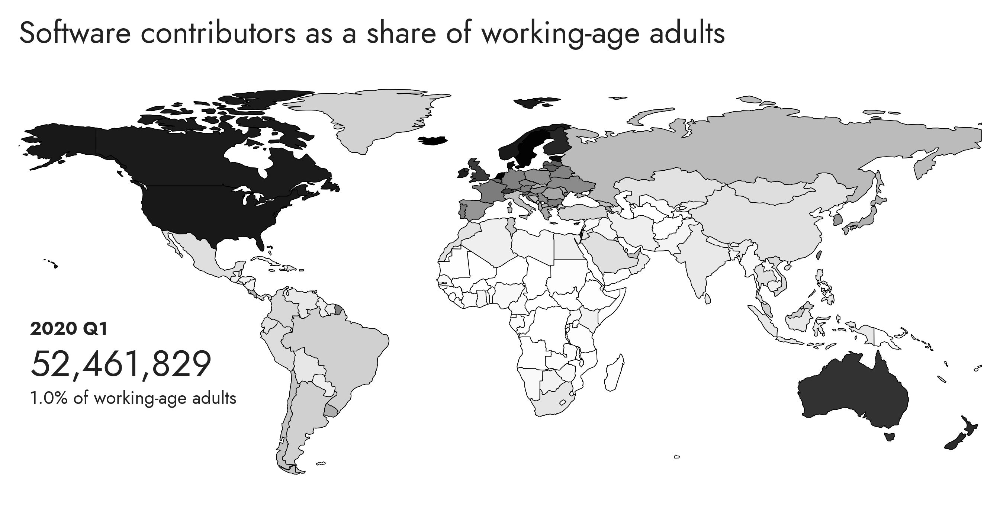

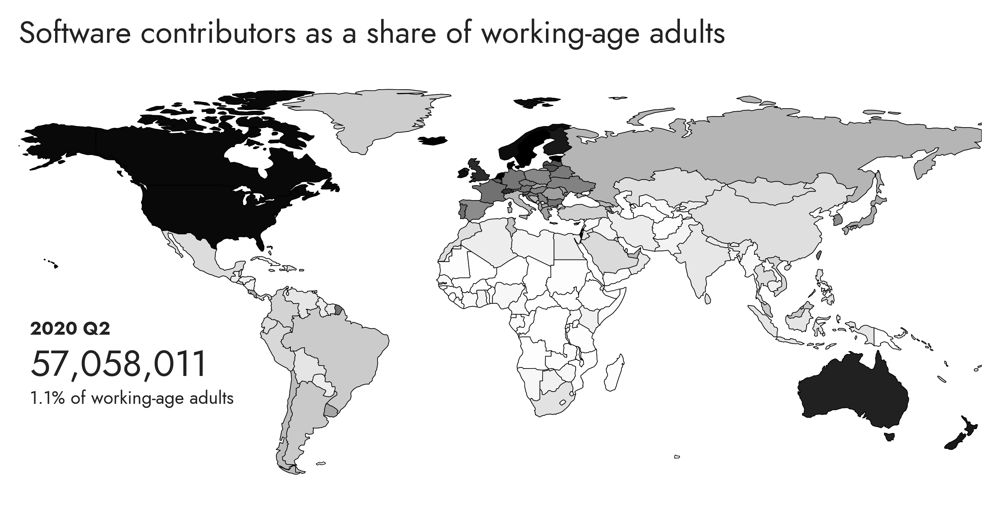

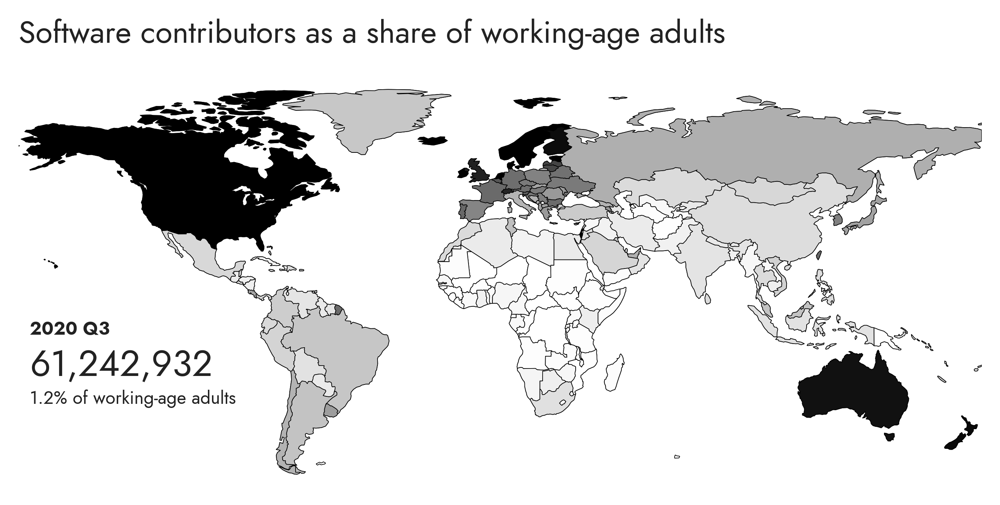

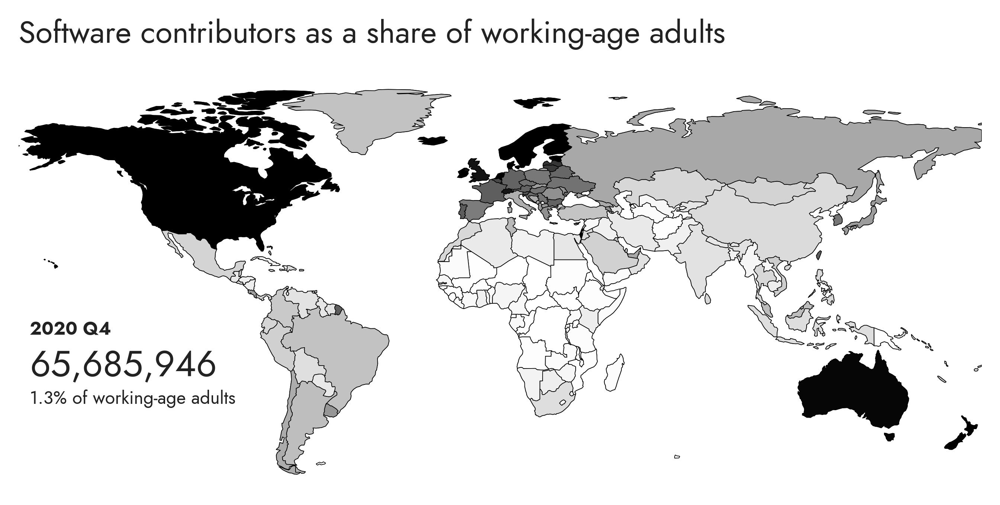

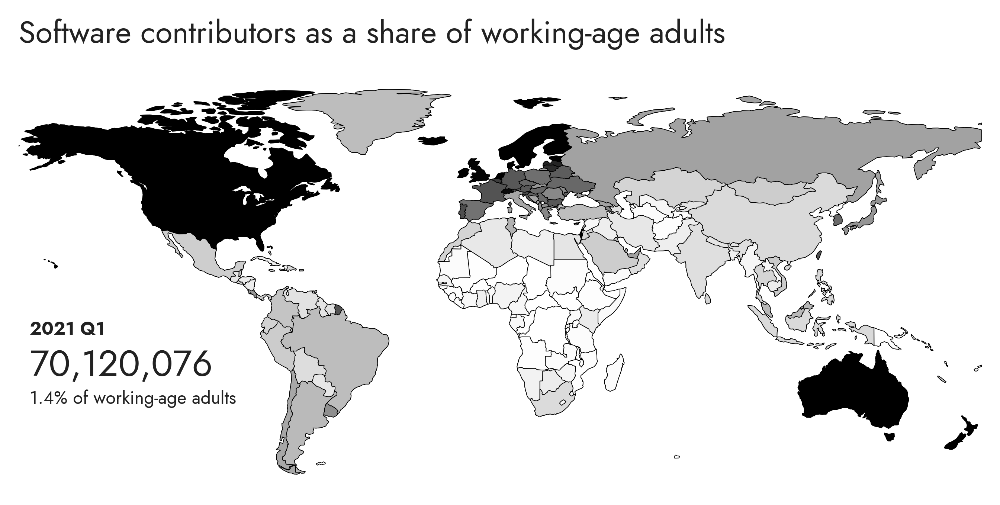

...

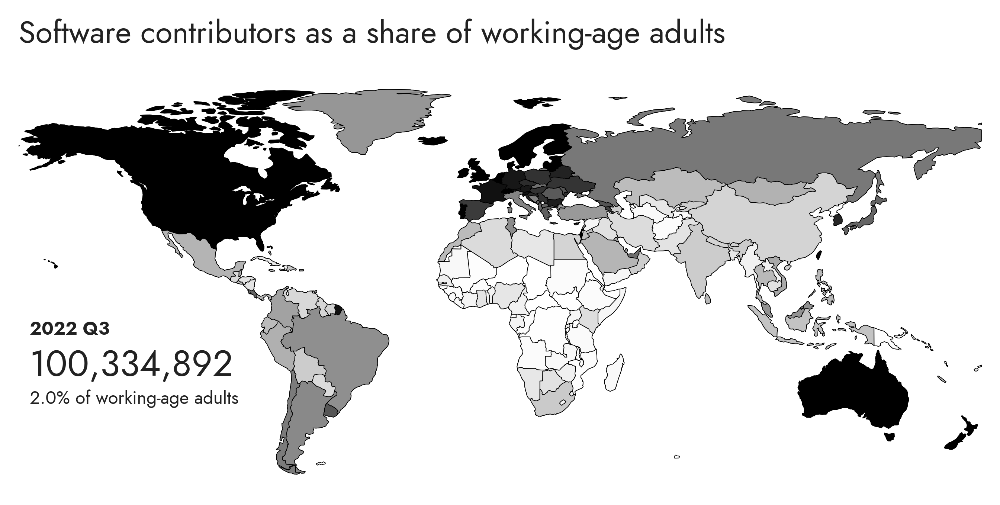

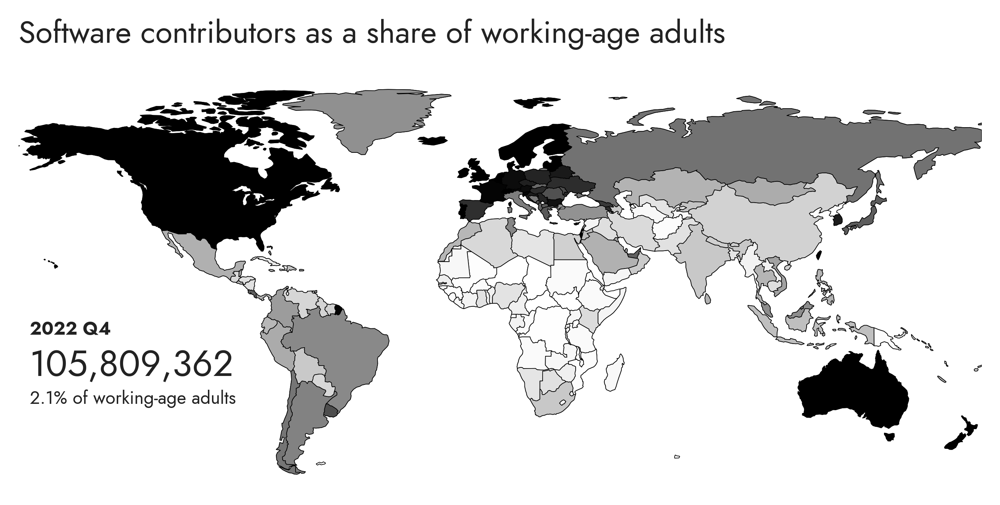

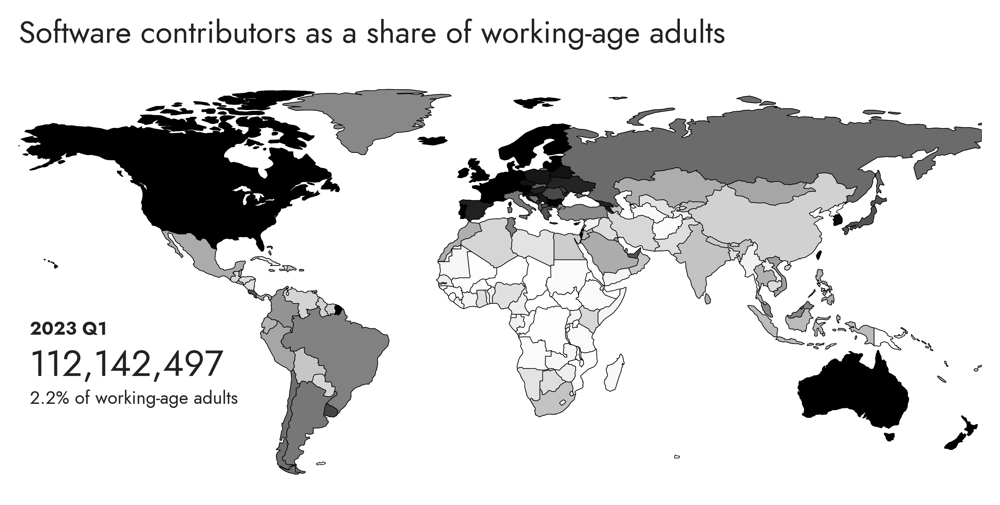

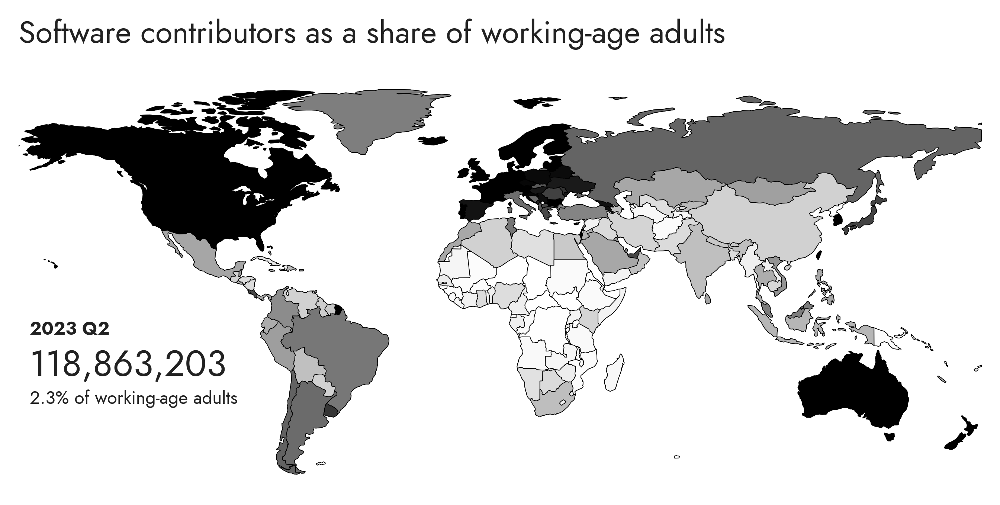

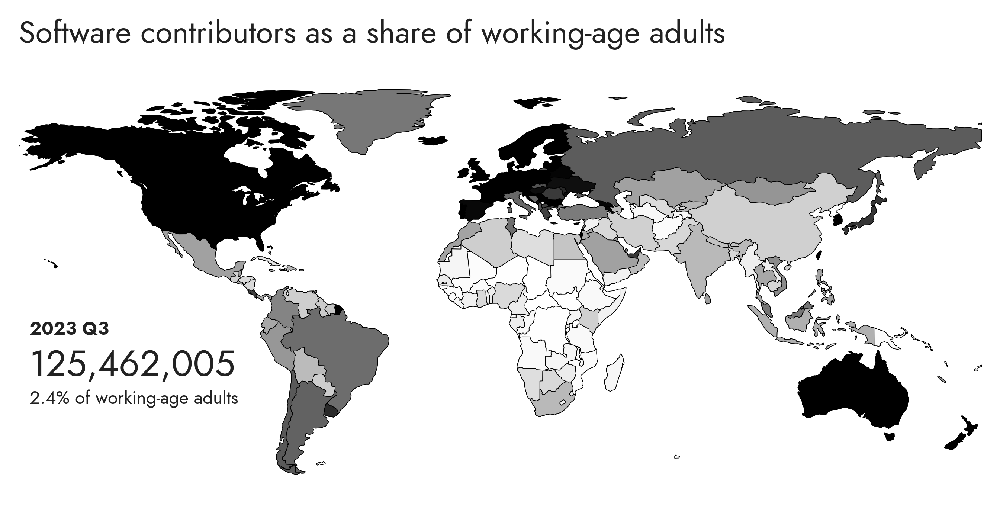

In [8]:
# create a series of images
paths = []
y = 2020    
for y in range(2020,2024):
    for q in range(1,5):
        if make_map(y,q):
            path = f"img/{y}Q{q}_oss_impact.png"
            plt.savefig(path, bbox_inches="tight")
            paths.append(path)
            
# load the image frames
frames = []
for p in paths:
    frame = Image.open(p)
    frames.append(frame)

# append the last one 3 times to create a pause effect    
for i in range(3):
    frames.append(frames[-1])

# save as gif
frames[0].save(
    "oss_impact.gif", 
    save_all=True, 
    append_images=frames[1:], 
    optimize=False, 
    duration=750, 
    loop=0
)